In [2]:
import os
os.getcwd()

'C:\\Users\\ambil\\Sundaram Sir'

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
pd.set_option('display.width',None)


In [6]:
dataset = pd.read_csv('Churn_Modelling.csv')
dataset

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
5,6,15574012,Chu,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,1
6,7,15592531,Bartlett,822,France,Male,50,7,0.00,2,1,1,10062.80,0
7,8,15656148,Obinna,376,Germany,Female,29,4,115046.74,4,1,0,119346.88,1
8,9,15792365,He,501,France,Male,44,4,142051.07,2,0,1,74940.50,0
9,10,15592389,H?,684,France,Male,27,2,134603.88,1,1,1,71725.73,0


In [7]:
dataset = dataset.drop(['RowNumber','CustomerId','Surname'], axis=1)
dataset.head() 

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [8]:
# check duplicate customer 
dataset.duplicated().sum()

0

In [9]:
# check missing data
dataset.isnull().sum()

CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

In [10]:
# check information about the dataset
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   CreditScore      10000 non-null  int64  
 1   Geography        10000 non-null  object 
 2   Gender           10000 non-null  object 
 3   Age              10000 non-null  int64  
 4   Tenure           10000 non-null  int64  
 5   Balance          10000 non-null  float64
 6   NumOfProducts    10000 non-null  int64  
 7   HasCrCard        10000 non-null  int64  
 8   IsActiveMember   10000 non-null  int64  
 9   EstimatedSalary  10000 non-null  float64
 10  Exited           10000 non-null  int64  
dtypes: float64(2), int64(7), object(2)
memory usage: 859.5+ KB


# Encoding

In [11]:
dataset['Geography'].value_counts()

Geography
France     5014
Germany    2509
Spain      2477
Name: count, dtype: int64

In [24]:
dataset = pd.get_dummies(dataset, columns=['Geography'])


KeyError: "None of [Index(['Geography'], dtype='object')] are in the [columns]"

In [25]:
dataset.head(2)

,CreditScore,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_Germany,Geography_Spain
0,619,0,42,2,0.00,1,1,1,101348.88,1,False,False
1,608,0,41,1,83807.86,1,0,1,112542.58,0,False,True


In [14]:
# dummy variables
dataset  = dataset.drop(['Geography_France'], axis=1)

In [26]:
dataset['Geography_Germany'] = dataset['Geography_Germany'].astype(int)


In [27]:
dataset['Geography_Spain'] = dataset['Geography_Spain'].astype(int)


In [16]:
dataset['Gender'].value_counts()

Gender
Male      5457
Female    4543
Name: count, dtype: int64

In [17]:
dataset['Gender'] = dataset['Gender'].astype('category')
dataset['Gender'] = dataset['Gender'].cat.codes

In [28]:
dataset.head(2)

,CreditScore,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_Germany,Geography_Spain
0,619,0,42,2,0.00,1,1,1,101348.88,1,0,0
1,608,0,41,1,83807.86,1,0,1,112542.58,0,0,1


In [32]:
# splitting the data into independent and dependent variable
x = dataset.drop(['Exited'], axis=1)
y = dataset['Exited']

In [34]:
x

,CreditScore,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_Germany,Geography_Spain
0,619,0,42,2,0.00,1,1,1,101348.88,0,0
1,608,0,41,1,83807.86,1,0,1,112542.58,0,1
2,502,0,42,8,159660.80,3,1,0,113931.57,0,0
3,699,0,39,1,0.00,2,0,0,93826.63,0,0
4,850,0,43,2,125510.82,1,1,1,79084.10,0,1
5,645,1,44,8,113755.78,2,1,0,149756.71,0,1
6,822,1,50,7,0.00,2,1,1,10062.80,0,0
7,376,0,29,4,115046.74,4,1,0,119346.88,1,0
8,501,1,44,4,142051.07,2,0,1,74940.50,0,0
9,684,1,27,2,134603.88,1,1,1,71725.73,0,0


In [35]:
y.value_counts()

Exited
0    7963
1    2037
Name: count, dtype: int64

In [ ]:
# imbalance treatment required however we use stratify to balance training and test dataset
import imblearn
from imblearn.over_sampling import SMOTE
smote= SMOTE()
x_smote, y_smote = smote.fit_resample(x,y)
print(y.value_counts())
print(y_smote.value_counts())

In [36]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0, stratify=y)
#x_train, x_test, y_train, y_test = train_test_split(x_smote, y_smote, test_size=0.2, random_state=0)

In [37]:
# data leakage problem - 
## 1) if we have train and test data seperately, we have to handle missing data, feature scaling, outlier treatment seperetly

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

<Axes: >

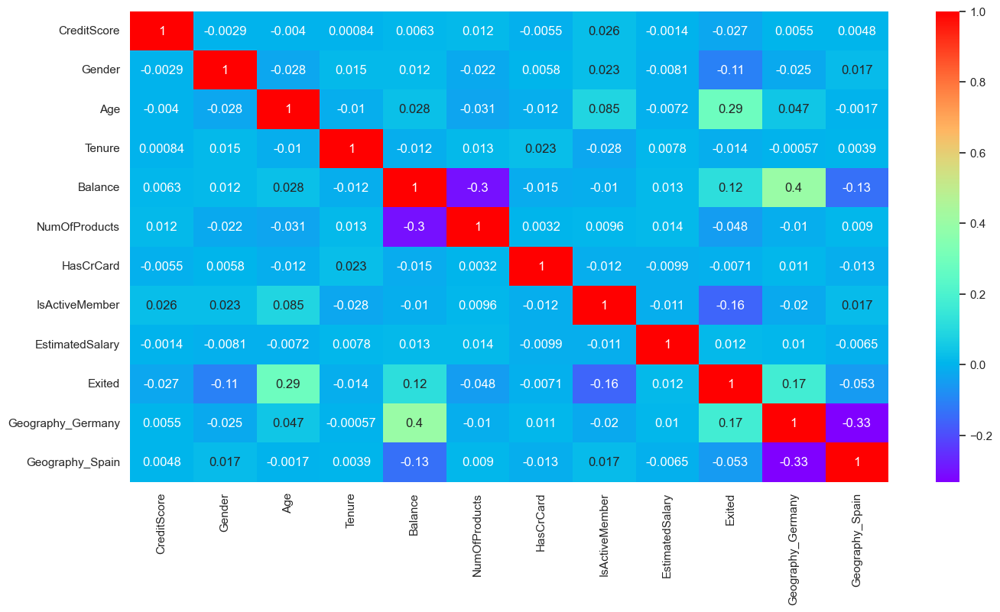

In [38]:
plt.figure(figsize=(16,8))
sns.heatmap(dataset.corr(), annot=True, cmap='rainbow')

<Axes: xlabel='Exited'>

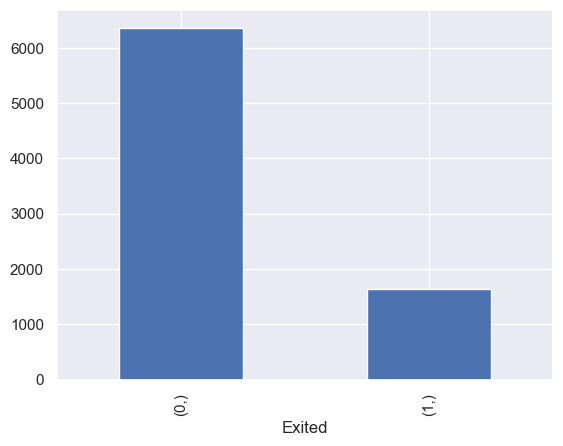

In [39]:
pd.DataFrame(y_train).value_counts().plot(kind='bar')

In [40]:
pd.DataFrame(y_test).value_counts()

Exited
0         1593
1          407
Name: count, dtype: int64

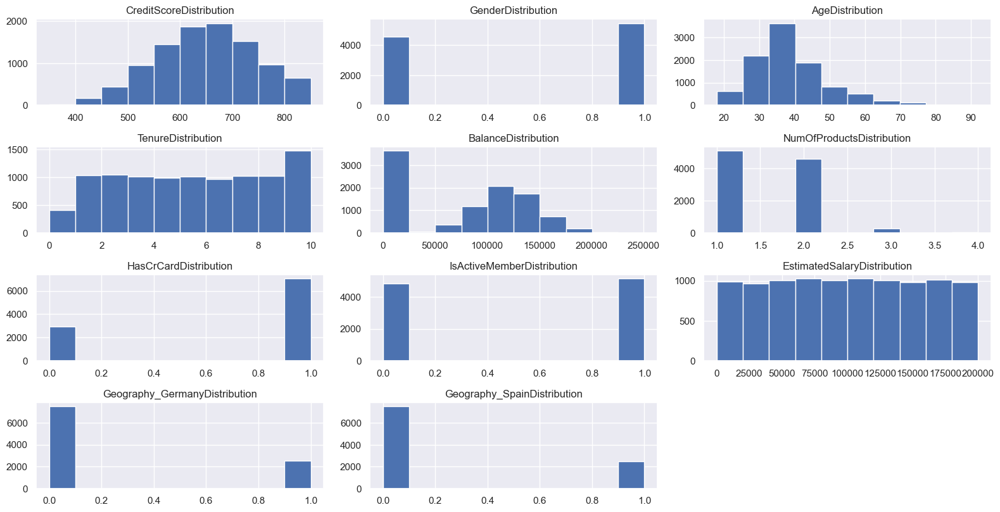

In [41]:
def draw_histogram(dataset, variables, n_rows, n_cols):
    fig = plt.figure(figsize=(16,10))
    for i, var_name in enumerate(variables):
        ax = fig.add_subplot(n_rows, n_cols, i+1)
        dataset[var_name].hist(bins=10, ax=ax)
        ax.set_title(var_name + "Distribution")
    fig.tight_layout()
    plt.show()
    
draw_histogram(dataset, x,5,3)

# Model Building

## Model 1 : AdaBoost

In [42]:
from sklearn.ensemble import AdaBoostClassifier
ada = AdaBoostClassifier()
ada.fit(x_train, y_train)

AdaBoostClassifier()

In [43]:
y_pred_train_ada = ada.predict(x_train)
y_pred_test_ada = ada.predict(x_test)

In [44]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

In [45]:
print(confusion_matrix(y_train, y_pred_train_ada))
print()
print(confusion_matrix(y_test, y_pred_test_ada))

[[6094  276]
 [ 836  794]]

[[1524   69]
 [ 233  174]]


In [46]:
print(classification_report(y_train, y_pred_train_ada))
print()
print(classification_report(y_test, y_pred_test_ada))

              precision    recall  f1-score   support

           0       0.88      0.96      0.92      6370
           1       0.74      0.49      0.59      1630

    accuracy                           0.86      8000
   macro avg       0.81      0.72      0.75      8000
weighted avg       0.85      0.86      0.85      8000


              precision    recall  f1-score   support

           0       0.87      0.96      0.91      1593
           1       0.72      0.43      0.54       407

    accuracy                           0.85      2000
   macro avg       0.79      0.69      0.72      2000
weighted avg       0.84      0.85      0.83      2000



In [47]:
print(accuracy_score(y_train, y_pred_train_ada))
print()
print(accuracy_score(y_test, y_pred_test_ada))

0.861

0.849


# Model 2 - Gradient Boosting Algorithm

In [48]:
from sklearn.ensemble import GradientBoostingClassifier 
# from sklearn.ensemble import GradientBoostingRegressor - regression problem

gdm = GradientBoostingClassifier()
gdm.fit(x_train, y_train)

GradientBoostingClassifier()

In [49]:
y_pred_train_gdm = gdm.predict(x_train)
y_pred_test_gdm = gdm.predict(x_test)

In [50]:
print(classification_report(y_train, y_pred_train_gdm))
print()
print(classification_report(y_test, y_pred_test_gdm))

              precision    recall  f1-score   support

           0       0.88      0.97      0.93      6370
           1       0.81      0.50      0.62      1630

    accuracy                           0.87      8000
   macro avg       0.85      0.74      0.77      8000
weighted avg       0.87      0.87      0.86      8000


              precision    recall  f1-score   support

           0       0.87      0.96      0.92      1593
           1       0.76      0.44      0.56       407

    accuracy                           0.86      2000
   macro avg       0.81      0.70      0.74      2000
weighted avg       0.85      0.86      0.84      2000



In [51]:
print(accuracy_score(y_train, y_pred_train_gdm))
print()
print(accuracy_score(y_test, y_pred_test_gdm))

0.87475

0.8575


# Model 3 - XGBoost Classification

In [52]:
!pip install xgboost


  Obtaining dependency information for xgboost from https://files.pythonhosted.org/packages/e2/7b/8c1b410cd0604cee9a167a19f7e1746f5b92ae7d02ad574ab560b73c5a48/xgboost-2.1.1-py3-none-win_amd64.whl.metadata
   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/124.9 MB 330.3 kB/s eta 0:06:19
   ---------------------------------------- 0.1/124.9 MB 825.8 kB/s eta 0:02:32
   ---------------------------------------- 0.2/124.9 MB 1.7 MB/s eta 0:01:13
   ---------------------------------------- 0.4/124.9 MB 2.3 MB/s eta 0:00:54
   ---------------------------------------- 0.6/124.9 MB 2.5 MB/s eta 0:00:50
   ---------------------------------------- 0.7/124.9 MB 2.7 MB/s eta 0:00:46
   ---------------------------------------- 0.9/124.9 MB 2.9 MB/s eta 0:00:44
   ---------------------------------------- 1.1/124.9 MB 2.9 MB/s eta 0:00:43
   ---------------------------------------- 1.2/124.9 MB 2.9 MB/s eta 0:00:43
   ---------------

In [53]:
from xgboost import XGBClassifier
xgb = XGBClassifier()
xgb.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [54]:
y_pred_train_xgb = xgb.predict(x_train)
y_pred_test_xgb = xgb.predict(x_test)

In [55]:
print(classification_report(y_train, y_pred_train_xgb))
print()
print(classification_report(y_test, y_pred_test_xgb))

              precision    recall  f1-score   support

           0       0.96      0.99      0.98      6370
           1       0.97      0.83      0.89      1630

    accuracy                           0.96      8000
   macro avg       0.96      0.91      0.93      8000
weighted avg       0.96      0.96      0.96      8000


              precision    recall  f1-score   support

           0       0.87      0.95      0.91      1593
           1       0.71      0.46      0.56       407

    accuracy                           0.85      2000
   macro avg       0.79      0.71      0.74      2000
weighted avg       0.84      0.85      0.84      2000



In [56]:
print(accuracy_score(y_train, y_pred_train_xgb))
print()
print(accuracy_score(y_test, y_pred_test_xgb))

0.9595

0.852


In [57]:
from sklearn.model_selection import cross_val_score
training_accuracy = cross_val_score(xgb, x_train, y_train, cv=10)
print(training_accuracy.mean())

0.852


# Model 4 - Bagging Classifier

In [58]:
from sklearn.ensemble import BaggingClassifier
bagging = BaggingClassifier()
bagging.fit(x_train, y_train)

BaggingClassifier()

In [59]:
y_pred_train_bagging = bagging.predict(x_train)
y_pred_test_bagging = bagging.predict(x_test)

In [60]:
print(classification_report(y_train, y_pred_train_bagging))
print()
print(classification_report(y_test, y_pred_test_bagging))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      6370
           1       0.99      0.93      0.96      1630

    accuracy                           0.98      8000
   macro avg       0.99      0.96      0.97      8000
weighted avg       0.98      0.98      0.98      8000


              precision    recall  f1-score   support

           0       0.87      0.95      0.91      1593
           1       0.68      0.45      0.54       407

    accuracy                           0.85      2000
   macro avg       0.78      0.70      0.73      2000
weighted avg       0.83      0.85      0.83      2000



In [61]:
print(accuracy_score(y_train, y_pred_train_bagging))
print()
print(accuracy_score(y_test, y_pred_test_bagging))

0.983625

0.8455


# Model 5 - RandomForest Classification

In [62]:
from sklearn.ensemble import RandomForestClassifier
rfm = RandomForestClassifier()
rfm.fit(x_train, y_train)

RandomForestClassifier()

In [63]:
y_pred_train_rfm = rfm.predict(x_train)
y_pred_test_rfm = rfm.predict(x_test)

In [64]:
print(classification_report(y_train, y_pred_train_rfm))
print()
print(classification_report(y_test, y_pred_test_rfm))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6370
           1       1.00      1.00      1.00      1630

    accuracy                           1.00      8000
   macro avg       1.00      1.00      1.00      8000
weighted avg       1.00      1.00      1.00      8000


              precision    recall  f1-score   support

           0       0.88      0.97      0.92      1593
           1       0.79      0.46      0.58       407

    accuracy                           0.86      2000
   macro avg       0.83      0.71      0.75      2000
weighted avg       0.86      0.86      0.85      2000



In [65]:
print(accuracy_score(y_train, y_pred_train_rfm))
print()
print(accuracy_score(y_test, y_pred_test_rfm))

1.0

0.865


In [ ]:
# Please note, boosting is for handling high bias problem and bagging for high variance problem

# Model 6 - K-Nearest Neighbors (KNN)

In [66]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train, y_train)

KNeighborsClassifier()

In [72]:
error_rate = []

for i in range(1,30):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train, y_train)
    y_pred = knn.predict(x_test)
    error_rate.append(np.mean(y_pred !=y_test))

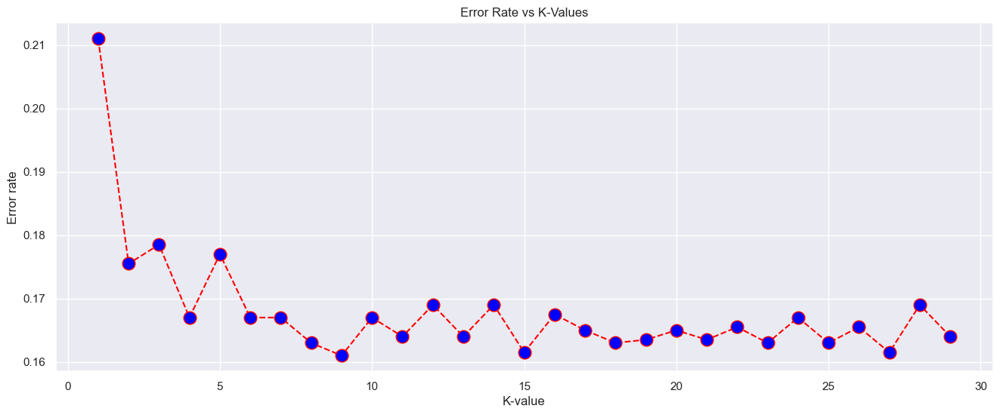

In [73]:
plt.figure(figsize=(16,6))
plt.plot(range(1,30), error_rate, color='red', linestyle='dashed', marker='o', markersize=12,
        markerfacecolor='blue')
plt.title("Error Rate vs K-Values")
plt.xlabel("K-value")
plt.ylabel("Error rate")
plt.show()

In [68]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=21)
knn.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=21)

In [69]:
y_pred_train_knn = knn.predict(x_train)
y_pred_test_knn = knn.predict(x_test)

In [70]:
print(classification_report(y_train, y_pred_train_knn))
print()
print(classification_report(y_test, y_pred_test_knn))

              precision    recall  f1-score   support

           0       0.85      0.98      0.91      6370
           1       0.80      0.32      0.45      1630

    accuracy                           0.84      8000
   macro avg       0.82      0.65      0.68      8000
weighted avg       0.84      0.84      0.82      8000


              precision    recall  f1-score   support

           0       0.84      0.98      0.90      1593
           1       0.76      0.29      0.42       407

    accuracy                           0.84      2000
   macro avg       0.80      0.63      0.66      2000
weighted avg       0.83      0.84      0.81      2000



In [71]:
print(accuracy_score(y_train, y_pred_train_knn))
print()
print(accuracy_score(y_test, y_pred_test_knn))

0.84425

0.8365
